# PRETRAIN FROM PERSONALLY TRAINED MODEL
## FastAI Cassava Root Disease Classification

In [1]:

## PREVIOUS BEST WITH ACC = 0.87
# RUN_NAME_OF_MODEL_TO_LOAD = '20210210-1221 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=40 bs=8 res=480'
# EPOCH_TO_LOAD = 1


# f'20210209-0234 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=40 bs=7 res=456'

# 8

<br>
<br>

In [2]:
from datetime import datetime
from fastbook import *
from fastai.vision.all import *
from fastai.vision.widgets import *
import fastai
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from string import ascii_uppercase
import numpy as np
import operator
import glob

import torch
from torch import nn as nn
from torch.nn import functional as F


%matplotlib inline

# %matplotlib widget

plt.rcParams['figure.figsize'] = [9, 5]
plt.rcParams['figure.dpi'] = 120
plt.style.use('dark_background')


ARCH = 'tf_efficientnet_b4_ns'  # resnet101

CHOSEN_SAMPLE_SIZE = 1800  # use this to control per-category sample sizes # 1000  # deprecated but not removed
# TEST_SET_SIZE = round(CHOSEN_SAMPLE_SIZE * 0.1)  # number of images per category to put in the test set
FROZEN_EPOCHS = 1  # 1
EPOCHS = 15  # 4
BATCH_SIZE = 12  # 16
# RESOLUTION = round(380 * 1.2)  # 300
RESOLUTION=460
PRETRAINED_FLAG = True

# data = ''
# rn_addon = f'_data={data}'

time = datetime.today().strftime("%Y%m%d-%H%M")

# RUN_NAME = f'{time} - arch={ARCH.__name__} - samples={CHOSEN_SAMPLE_SIZE} frozen={FROZEN_EPOCHS} epochs={EPOCHS} bs={BATCH_SIZE} res={RESOLUTION}'
RUN_NAME = f'{time} - arch={ARCH} - samples={CHOSEN_SAMPLE_SIZE} frozen={FROZEN_EPOCHS} epochs={EPOCHS} bs={BATCH_SIZE} res={RESOLUTION}'

print(f"RUN_NAME = '{RUN_NAME}'")


RUN_NAME = '20210211-0115 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460'


In [3]:
import torch
print('CUDA available: '.ljust(28), torch.cuda.is_available())
print('CUDA device count: '.ljust(28), torch.cuda.device_count())

current_device = torch.cuda.current_device()
print('Current CUDA Device index: '.ljust(28), current_device)
# torch.cuda.device(current_device)
print('Current CUDA Device: '.ljust(28), torch.cuda.get_device_name(current_device))
print()
# print('CUDA available: '.ljust(24), torch.cuda.is_available())
print(f'fastai version:              {fastai.__version__}')
# print(f'fastcore version:            {fastcore.__version__}')
# print(f'fastbook version:            {fastbook.__version__}')
print(f'cuda version:                {torch.version.cuda}')
print(f'torch version:               {torch.__version__}')
# print(f'python version:              {python_version()}')

CUDA available:              True
CUDA device count:           1
Current CUDA Device index:   0
Current CUDA Device:         GeForce RTX 2070 SUPER

fastai version:              2.2.2
cuda version:                11.0
torch version:               1.7.0


<br>
<br>

## Utility Functions to use timm models on FastAI

written by Zach Mueller / walkwithfastai.com



In [4]:
from timm import create_model
from fastai.vision.learner import _update_first_layer

def create_timm_body(arch:str, pretrained=True, cut=None, n_in=3):
    "Creates a body from any model in the `timm` library."
    model = create_model(arch, pretrained=pretrained, num_classes=0, global_pool='')
    _update_first_layer(model, n_in, pretrained)
    if cut is None:
        ll = list(enumerate(model.children()))
        cut = next(i for i,o in reversed(ll) if has_pool_type(o))
    if isinstance(cut, int): return nn.Sequential(*list(model.children())[:cut])
    elif callable(cut): return cut(model)
    else: raise NamedError("cut must be either integer or function")
        
def create_timm_model(arch:str, n_out, cut=None, pretrained=True, n_in=3, init=nn.init.kaiming_normal_, custom_head=None,
                     concat_pool=False, **kwargs):
    "Create custom architecture using `arch`, `n_in` and `n_out` from the `timm` library"
    body = create_timm_body(arch, pretrained, None, n_in)
    if custom_head is None:
        nf = num_features_model(nn.Sequential(*body.children())) * (2 if concat_pool else 1)
        head = create_head(nf, n_out, concat_pool=concat_pool, **kwargs)
    else: head = custom_head
    model = nn.Sequential(body, head)
    if init is not None: apply_init(model[1], init)
    return model


def timm_learner(dls, arch:str, loss_func=None, pretrained=True, cut=None, splitter=None,
                y_range=None, config=None, n_out=None, normalize=True, **kwargs):
    "Build a convnet style learner from `dls` and `arch` using the `timm` library"
    if config is None: config = {}
    if n_out is None: n_out = get_c(dls)
    assert n_out, "`n_out` is not defined, and could not be inferred from data, set `dls.c` or pass `n_out`"
    if y_range is None and 'y_range' in config: y_range = config.pop('y_range')
    model = create_timm_model(arch, n_out, default_split, pretrained, y_range=y_range, **config)
    learn = Learner(dls, model, loss_func=loss_func, splitter=default_split, **kwargs)
    if pretrained: learn.freeze()
    return learn

import kornia
def convert_MP_to_blurMP(model, layer_type_old):
    conversion_count = 0
    for name, module in reversed(model._modules.items()):
        if len(list(module.children())) > 0:
            # recurse
            model._modules[name] = convert_MP_to_blurMP(module, layer_type_old)

        if type(module) == layer_type_old:
            layer_old = module
            layer_new = kornia.contrib.MaxBlurPool2d(3, True)
            model._modules[name] = layer_new

    return model


def convert_act_cls(model, layer_type_old, layer_type_new):
    conversion_count = 0
    for name, module in reversed(model._modules.items()):
        if len(list(module.children())) > 0:
            # recurse
            model._modules[name] = convert_act_cls(module, layer_type_old, layer_type_new)

        if type(module) == layer_type_old:
            layer_old = module
            layer_new = layer_type_new
            model._modules[name] = layer_new

    return model

<br>
<br>

### Add a Module for Gradient Checkpointing

In [5]:


from torch.utils.checkpoint import checkpoint, checkpoint_sequential

class CheckpointModule(Module):
    def __init__(self, module, num_segments=1):
        assert num_segments == 1 or isinstance(module, nn.Sequential)
        self.module = module
        self.num_segments = num_segments

    def forward(self, *inputs):
        if self.num_segments > 1:
            return checkpoint_sequential(self.module, self.num_segments, *inputs)
        else:
            return checkpoint(self.module, *inputs)
        
        

def convert_seq_chkpt(model, layer_type_old):
    conversion_count = 0
    for name, module in reversed(model._modules.items()):
        if len(list(module.children())) > 0:
            # recurse
            model._modules[name] = convert_seq_chkpt(module, layer_type_old)

        if type(module) == layer_type_old:
            layer_old = module
            layer_new = CheckpointModule(layer_old)  # wrap sequential in a checkpoint module
            model._modules[name] = layer_new

    return model

## Memory efficient implementation of Swish and Mish from Ross Wightman

In [6]:
class SwishAutoFn(torch.autograd.Function):
    """Swish - Described in: https://arxiv.org/abs/1710.05941
    Memory efficient variant from:
     https://medium.com/the-artificial-impostor/more-memory-efficient-swish-activation-function-e07c22c12a76
    """
    @staticmethod
    def forward(ctx, x):
        result = x.mul(torch.sigmoid(x))
        ctx.save_for_backward(x)
        return result

    @staticmethod
    def backward(ctx, grad_output):
        x = ctx.saved_tensors[0]
        x_sigmoid = torch.sigmoid(x)
        return grad_output.mul(x_sigmoid * (1 + x * (1 - x_sigmoid)))


def swish_auto(x, inplace=False):
    # inplace ignored
    return SwishAutoFn.apply(x)


class SwishAuto(nn.Module):
    def __init__(self, inplace: bool = True):
        super(SwishAuto, self).__init__()
        self.inplace = inplace

    def forward(self, x):
        return SwishAutoFn.apply(x)




class MishAutoFn(torch.autograd.Function):
    """Mish: A Self Regularized Non-Monotonic Neural Activation Function - https://arxiv.org/abs/1908.08681
    Experimental memory-efficient variant
    """

    @staticmethod
    def forward(ctx, x):
        ctx.save_for_backward(x)
        y = x.mul(torch.tanh(F.softplus(x)))  # x * tanh(ln(1 + exp(x)))
        return y

    @staticmethod
    def backward(ctx, grad_output):
        x = ctx.saved_tensors[0]
        x_sigmoid = torch.sigmoid(x)
        x_tanh_sp = F.softplus(x).tanh()
        return grad_output.mul(x_tanh_sp + x * x_sigmoid * (1 - x_tanh_sp * x_tanh_sp))


def mish_auto(x, inplace=False):
    # inplace ignored
    return MishAutoFn.apply(x)


class MishAuto(nn.Module):
    def __init__(self, inplace: bool = True):
        super(MishAuto, self).__init__()
        self.inplace = inplace

    def forward(self, x):
        return MishAutoFn.apply(x)

<br>
<br>

### Check for Imbalance

In [7]:
classes = ['cbb', 'cbsd', 'cgm', 'cmd', 'healthy']

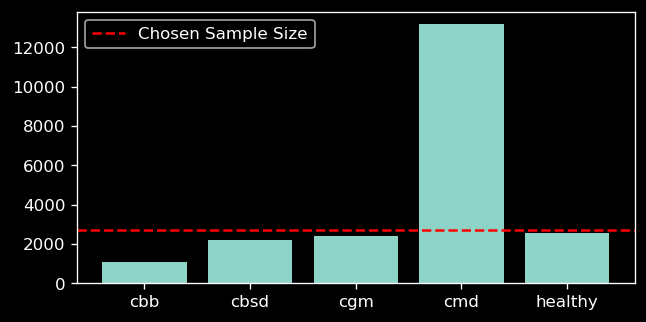

In [8]:
path = '../data/train_images_sorted'

img_flist = {}
img_quants = {}

for c in classes:
    files = get_image_files(f'{path}/{c}')
    img_flist[c] = list(files)
    img_quants[c] = len(files)

minqc = min(img_quants, key=img_quants.get)

sample_size = round(img_quants[minqc] * 2.5)  # oversample the lowest class quantity


plt.figure(figsize=(6,3))
plt.bar(img_quants.keys(), img_quants.values())  
plt.axhline(sample_size, ls='--', color='red', label='Chosen Sample Size')
plt.legend()
plt.show()
        

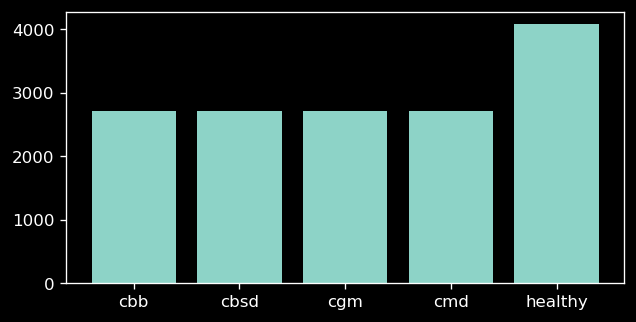

In [9]:

for c in classes:
    if len(img_flist[c]) < sample_size:
#         all_covid = img_flist[c].copy()
        img_flist[c] = np.append(img_flist[c], np.random.choice(img_flist[c], sample_size - len(img_flist[c]), replace=True))
    else:
        img_flist[c] = np.random.choice(img_flist[c], sample_size, replace=False)  # without replacement

    # boost the weak class
    if c == 'healthy':
        img_flist[c] = np.append(img_flist[c], np.random.choice(img_flist[c], round(sample_size * 0.5), replace=False))
        
plt.figure(figsize=(6,3))
plt.bar(img_flist.keys(), [len(l) for l in img_flist.values()])
plt.show()

In [10]:
test_flist = {}
test_size = round(0.1 * sample_size)

for c in classes:
    img_flist[c] = np.random.choice(img_flist[c], len(img_flist[c]), replace=False)  # shuffle
    test_flist[c] = img_flist[c][0:test_size]
    img_flist[c] = img_flist[c][test_size:]
#     img_flist[c] = [f for f in img_flist[c] if f not in test_flist[c]]

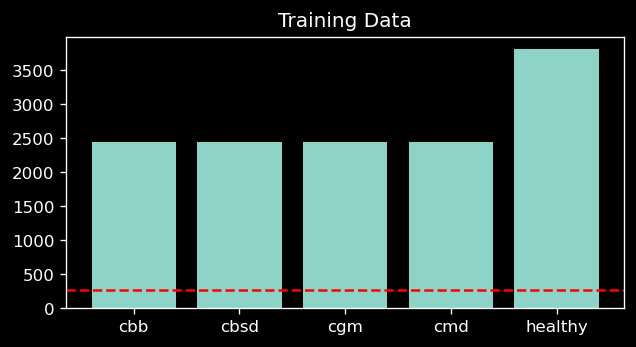

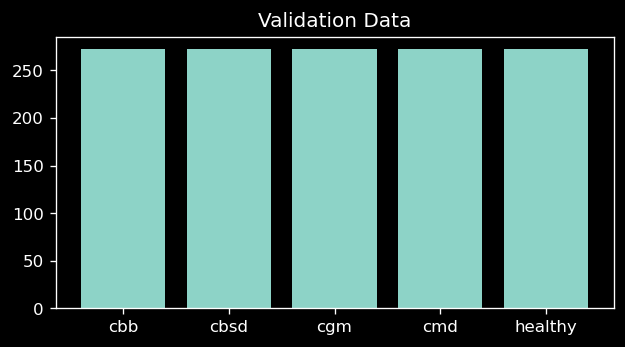

In [11]:
plt.figure(figsize=(6,3))
plt.title('Training Data')
plt.bar(img_flist.keys(), [len(l) for l in img_flist.values()])
plt.axhline(test_size, ls='--', color='red')
plt.show()

plt.figure(figsize=(6,3))
plt.title('Validation Data')
plt.bar(test_flist.keys(), [len(l) for l in test_flist.values()])
plt.show()
                 

In [12]:
def get_fnames(path):
    retlist = []
    
    for l in img_flist.values():
        for f in l:
            retlist.append(f)
            
    return random.sample(retlist, len(retlist))

# batch_tfms = [ *aug_transforms(size=round(RESOLUTION * 1), do_flip=True, batch=True, max_zoom=1.7, mult=2.4), Normalize.from_stats(*imagenet_stats) ]
batch_tfms = [ *aug_transforms(size=RESOLUTION, do_flip=True, batch=False, max_lighting=0.2,
                               max_rotate=45, max_zoom=2.5, mult=2.0, max_warp=0.1), 
              Normalize.from_stats(*imagenet_stats) ]


img_db = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_fnames, 
    splitter=RandomSplitter(valid_pct=0.28, seed=42),
    get_y=parent_label,
    item_tfms=Resize(RESOLUTION, method='bilinear') , batch_tfms=batch_tfms)
#     item_tfms=RandomResizedCrop(RESOLUTION) , batch_tfms=batch_tfms)

dls = img_db.dataloaders(path, batch_size=BATCH_SIZE)

<br>

### Verify the Training and Validation Batches

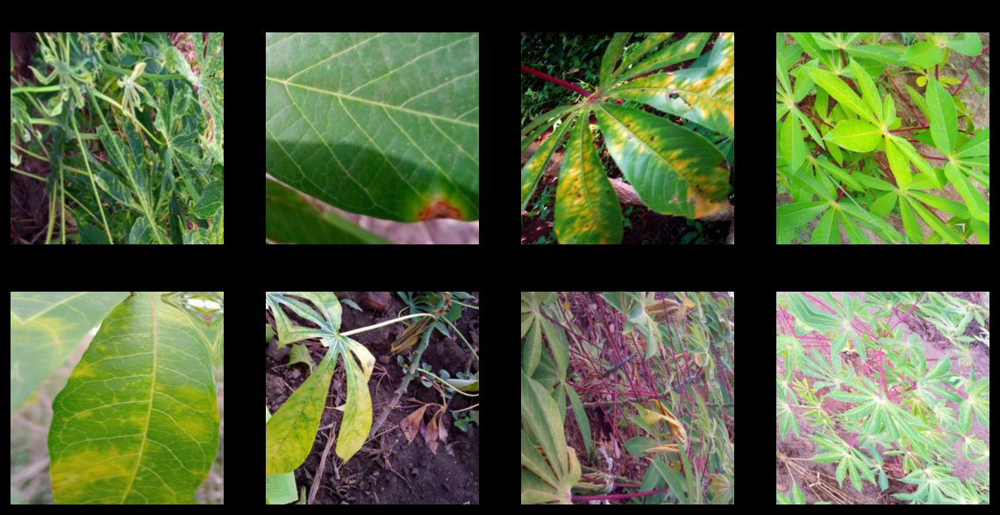

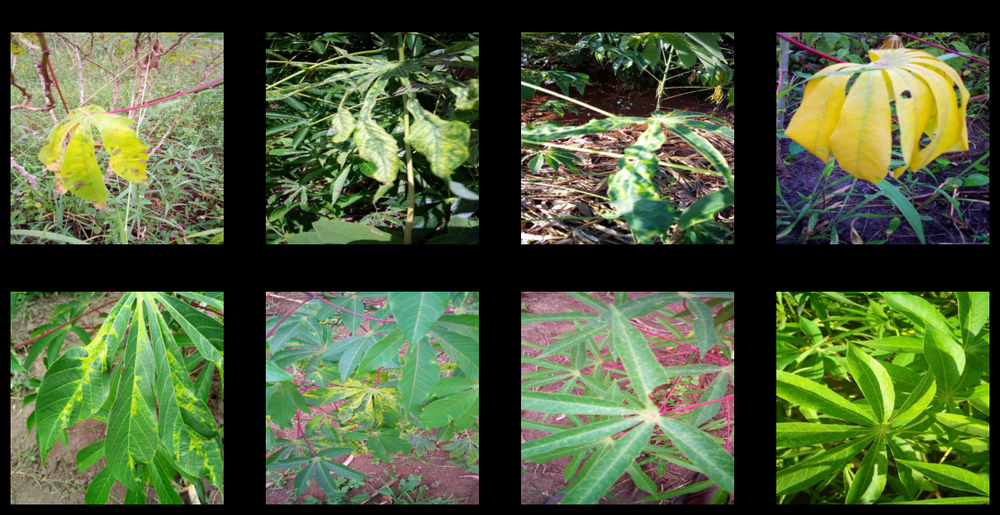

In [13]:
dls.train.show_batch(max_n=8, nrows=2)
dls.valid.show_batch(max_n=8, nrows=2)

In [14]:
# Eary stopping callback
early_stop_cb = EarlyStoppingCallback(monitor='error_rate', min_delta=0.0001, patience=5)

# Save the current model's weights every epoch
save_cb = SaveModelCallback(fname=RUN_NAME, every_epoch=True, with_opt=True)

# Reduce the Learning Rate if valid_loss flatlines
reduceLR_cb = ReduceLROnPlateau(monitor='valid_loss', min_delta=0.01, min_lr=1e-8, patience=2, factor=8, reset_on_fit=False)

# Mixup callback for regularization
# mixup_cb = MixUp(alpha=0.4)
mixup_cb = None

# Cutmix callback for regularization
cutmix_cb = CutMix(alpha=240.0)
# cutmix_cb = None

# Gradient Accumulation
# gradacc_cb =  GradientAccumulation(n_acc=16)
gradacc_cb =  GradientAccumulation(n_acc=12)


# List of callbacks to be used later
cbs = [ShowGraphCallback(), save_cb, reduceLR_cb, gradacc_cb, GradientClip]

if mixup_cb != None:
    cbs.insert(0, mixup_cb)
    
if cutmix_cb != None:
    cbs.insert(0, cutmix_cb)




print('\nAll Callbacks: ', cbs)


All Callbacks:  [CutMix, ShowGraphCallback, SaveModelCallback, ReduceLROnPlateau, GradientAccumulation, <class 'fastai.callback.training.GradientClip'>]


### Visualize the effect of CutMix


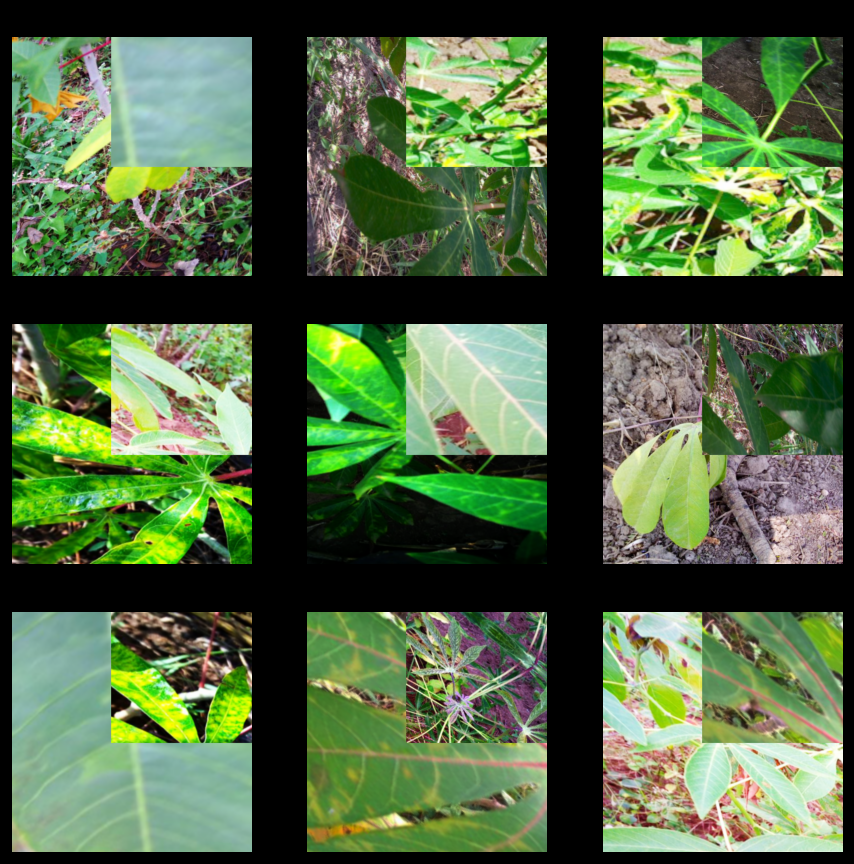

In [15]:
if cutmix_cb != None:
    with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=cutmix_cb) as learn:
        learn.epoch,learn.training = 0,True
        learn.dl = dls.train
        b = dls.one_batch()
        learn._split(b)
        learn('before_batch')

    _,axs = plt.subplots(3,3, figsize=(9,9))
    dls.show_batch(b=(cutmix_cb.x,cutmix_cb.y), ctxs=axs.flatten())
    
else: print('\n CutMix was not selected.')

<br>

### Visualize the Effect of MixUp

MixUp creates a linear interpolation between the target data and another datapoint.  In images, it shows up as ghostly figures.  The technique has been shown to be a good to decrease the liklihood of overfitting.

In [16]:
if mixup_cb != None:
    with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=mixup_cb) as learn:
        learn.epoch,learn.training = 0,True
        learn.dl = dls.train
        b = dls.one_batch()
        learn._split(b)
        learn('before_batch')

    _,axs = plt.subplots(3,3, figsize=(9,9))
    dls.show_batch(b=(mixup_cb.x,mixup_cb.y), ctxs=axs.flatten())

else: print('\n MixUp was not selected.')


 MixUp was not selected.


In [17]:
# learn = cnn_learner(dls, ARCH , 
#                     pretrained=PRETRAINED_FLAG, wd=1e-4, opt_func=ranger,
#                     loss_func=LabelSmoothingCrossEntropyFlat(), 
#                     cbs = cbs, metrics=[error_rate, accuracy])

# from wwf.vision.timm import *
import timm
learn = timm_learner(dls, 
                    'tf_efficientnet_b4_ns',
                     opt_func=ranger,
                     loss_func=LabelSmoothingCrossEntropy(),
                     cbs=cbs,
                     metrics = [accuracy])



In [18]:
# Add custom weights to learn

# learn = load_learner(f'../models/{RUN_NAME_OF_MODEL_TO_LOAD}.pkl', cpu=False)
# load_model(f'models/{RUN_NAME_OF_MODEL_TO_LOAD}_{EPOCH_TO_LOAD}.pth', learn, opt=ranger, with_opt=False)

# learn = convert_MP_to_blurMP(learn, nn.MaxPool2d)  # doesn't exist!
learn.model = convert_act_cls(learn.model, nn.ReLU, MishAuto())  # very expensive so we only use it on the last layers
learn.model = convert_act_cls(learn.model, nn.SiLU, SwishAuto())  # replace with a lower memory version


learn.model[0] = convert_seq_chkpt(learn.model[0], nn.Sequential)  # wrap all BODY sequentials to use Gradient Checkpointing
learn.model[0] = nn.Sequential(CheckpointModule(learn.model[0]))  # hack in the final checkpointmodule for the base sequence

learn = learn.to_fp16()  # convert to 16bit

In [19]:
display(learn.loss_func, learn.opt_func, learn.cbs) #, '-------------------------------------', learn.model)  # Checkpoint

LabelSmoothingCrossEntropy()

<function fastai.optimizer.ranger(p, lr, mom=0.95, wd=0.01, eps=1e-06, sqr_mom=0.99, beta=0.0, decouple_wd=True)>

(#10) [TrainEvalCallback,Recorder,ProgressCallback,CutMix,ShowGraphCallback,SaveModelCallback,ReduceLROnPlateau,GradientAccumulation,GradientClip,MixedPrecision]

<br>
<br>
<br>

## Find a Good Learning Rate to Start With

In [20]:
LR_DIV = 14e0  # Shift the lr_min left by this amount.  Adjust as necessary
lr_min = 0.002  # just a default

/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


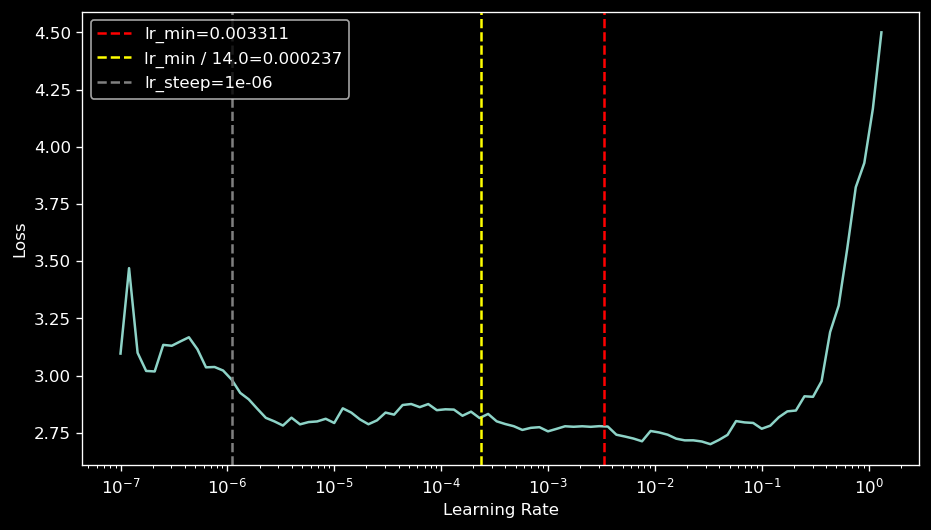

Minimum/10: 3.31e-03, steepest point: 1.10e-06, (Mim/10)/14.0: 0.00023652222007513048


In [21]:
if PRETRAINED_FLAG == True:
    learn.freeze()
    lr_min,lr_steep = learn.lr_find()
    plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
    plt.axvline(lr_min/LR_DIV, ls='--', color='yellow', label=f'lr_min / {LR_DIV}={round(lr_min/LR_DIV,6)}')
    plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
    plt.legend()
    plt.show()

    print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}, (Mim/10)/{LR_DIV}: {lr_min/LR_DIV}")

<br>
<br>

# Pick a Good Initial Learning Rate

In [20]:
# LR_CHOICE = lr_min/LR_DIV
# LR_CHOICE = lr_steep
# LR_CHOICE = 8e-5
# LR_CHOICE = 2e-4
LR_CHOICE = 7e-4

<br>
<br>

<br>
<br>

# Training the Model

<br>

## Fit the last layers, unfreeze, fit the whole net, with a decent initial LR, all in one go.



FROZEN_EPOCHS:  1
EPOCHS:         15
Learning Rate:  0.0007




epoch,train_loss,valid_loss,accuracy,time
0,1.870535,1.208099,0.573344,02:19


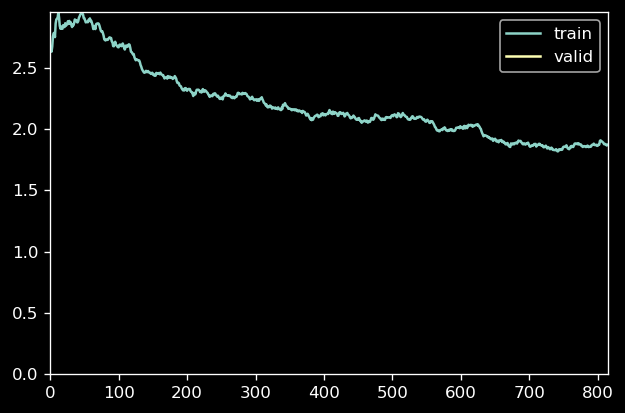

Max GPU Memory Allocated: 3.97091328 GB


/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(


In [23]:


if PRETRAINED_FLAG:
    print(f'FROZEN_EPOCHS:  {FROZEN_EPOCHS}')
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE}\n\n')

if PRETRAINED_FLAG:
    learn.fit_flat_cos(FROZEN_EPOCHS, slice(LR_CHOICE), pct_start=0.99, wd=0.1)
    print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
    torch.cuda.reset_max_memory_allocated()

## Manually set up the unfrozen runs

In [24]:
learn.unfreeze()

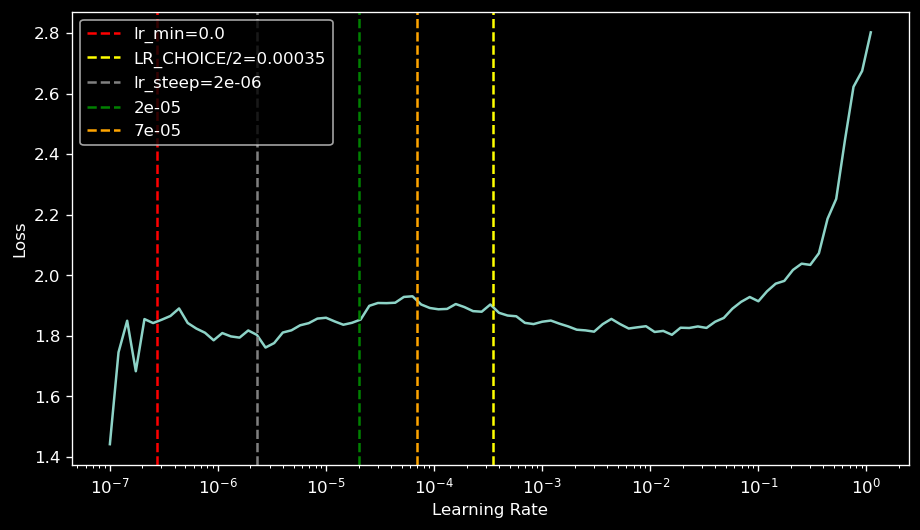

In [25]:
lr_min,lr_steep = learn.lr_find()
plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
plt.axvline(LR_CHOICE/2, ls='--', color='yellow', label=f'LR_CHOICE/2={round(LR_CHOICE/2,6)}')
plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
plt.axvline(2e-5, ls='--', color='green', label=f'{round(2e-5,6)}')
plt.axvline(7e-5, ls='--', color='orange', label=f'{round(7e-5,6)}')

plt.legend()
plt.show()

In [26]:
print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}, LR_CHOICE/2: {LR_CHOICE / 2}")

Minimum/10: 2.75e-07, steepest point: 2.29e-06, LR_CHOICE/2: 0.00035


## Pick a new Learning Rate

In [27]:
# LR_CHOICE_UNFROZ = lr_min/LR_DIV
# LR_CHOICE_UNFROZ = LR_CHOICE / 2
# LR_CHOICE_UNFROZ = 0.00015
# LR_CHOICE_UNFROZ = 10e-5
# LR_CHOICE_UNFROZ = 0.00008
# LR_CHOICE_UNFROZ = 5.5e-5
# LR_CHOICE_UNFROZ = 1.7e-4
# LR_CHOICE_UNFROZ = 6e-5
# LR_CHOICE_UNFROZ = lr_min
# LR_CHOICE_UNFROZ = 1e-3
LR_CHOICE_UNFROZ = 7e-3

### Train

In [28]:
EPOCHS = 10

In [29]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

EPOCHS:         10
Learning Rate:  0.007




epoch,train_loss,valid_loss,accuracy,time
0,1.626176,1.303104,0.498948,02:20
1,1.529326,1.220008,0.570978,02:20
2,1.476285,1.190696,0.584385,02:20
3,1.431751,1.181966,0.600421,02:19
4,1.449345,1.187868,0.583596,02:20
5,1.439196,1.157231,0.606204,02:20
6,1.420892,1.123044,0.632229,02:21
7,1.379620,1.108664,0.640904,02:20
8,1.393759,1.108529,0.642482,02:20
9,1.378494,1.104718,0.648002,02:20


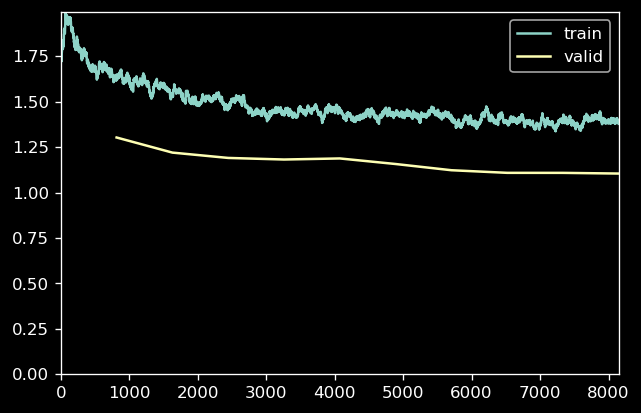

Epoch 4: reducing lr to 0.0007
Epoch 9: reducing lr to 1e-08
Max GPU Memory Allocated: 3.971198976 GB


In [30]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.5, wd=1e-2)
print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

<br>
<br>

<br>
<br>

<br>
<br>

### Train again

In [21]:
# learn = load_learner(f'../models/{RUN_NAME}.pkl', cpu=False)
#
# RUN_NAME_OF_MODEL_TO_LOAD = '20210210-2234 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460'
# EPOCH_TO_LOAD = 9

RUN_NAME_OF_MODEL_TO_LOAD = '20210211-0115 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460'
EPOCH_TO_LOAD = 7

load_model(f'models/{RUN_NAME_OF_MODEL_TO_LOAD}_{EPOCH_TO_LOAD}.pth', learn, opt=ranger, with_opt=False)

# load_model(f'models/{RUN_NAME}_9.pth', learn, opt=ranger, with_opt=False)

In [34]:
learn.unfreeze()

/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


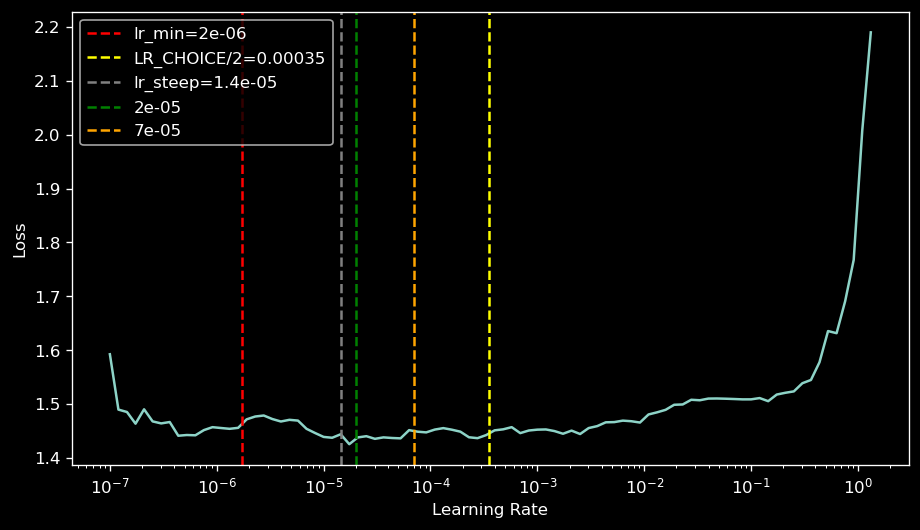

In [35]:
lr_min,lr_steep = learn.lr_find()
plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
plt.axvline(LR_CHOICE/2, ls='--', color='yellow', label=f'LR_CHOICE/2={round(LR_CHOICE/2,6)}')
plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
plt.axvline(2e-5, ls='--', color='green', label=f'{round(2e-5,6)}')
plt.axvline(7e-5, ls='--', color='orange', label=f'{round(7e-5,6)}')

plt.legend()
plt.show()

In [36]:
EPOCHS = 20
LR_CHOICE_UNFROZ = 0.007

In [37]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

EPOCHS:         20
Learning Rate:  0.06




epoch,train_loss,valid_loss,accuracy,time
0,1.681255,259.183411,0.285226,02:20
1,1.684995,2.178962,0.227918,02:20
2,1.650787,1.606244,0.313354,02:20
3,1.637568,5.893795,0.383018,02:20
4,1.686955,1.399705,0.425079,02:20
5,1.649305,1.388138,0.465563,02:20
6,1.708778,2.521957,0.249211,02:20
7,1.672188,1.375494,0.498160,02:21
8,1.680931,669.736938,0.183491,02:25
9,1.664690,1.754273,0.425605,02:23


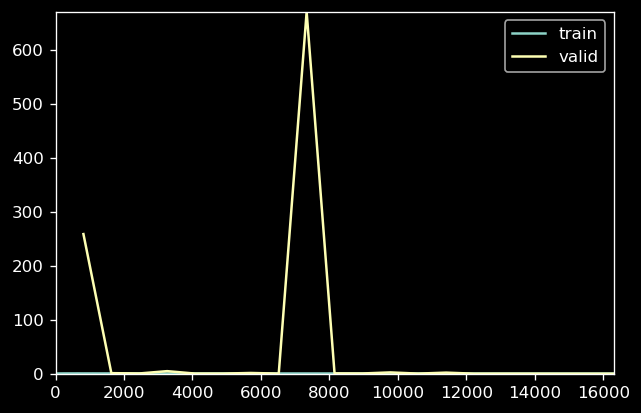

Epoch 9: reducing lr to 0.006
Epoch 11: reducing lr to 0.00542773646201419
Epoch 16: reducing lr to 0.0012376278508880144
Max GPU Memory Allocated: 4.084237824 GB


/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(


In [38]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.5, wd=0.1) # , reset_opt=True)
print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

<br>
<br>

<br>
<br>

### Train again

In [21]:
# learn = load_learner(f'../models/{RUN_NAME}.pkl', cpu=False)
#
RUN_NAME_OF_MODEL_TO_LOAD = '20210211-0115 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460'
EPOCH_TO_LOAD = 7

load_model(f'models/{RUN_NAME_OF_MODEL_TO_LOAD}_{EPOCH_TO_LOAD}.pth', learn, opt=ranger, with_opt=False)

# load_model(f'models/{RUN_NAME}_9.pth', learn, opt=ranger, with_opt=False)

In [22]:
learn.unfreeze()

/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


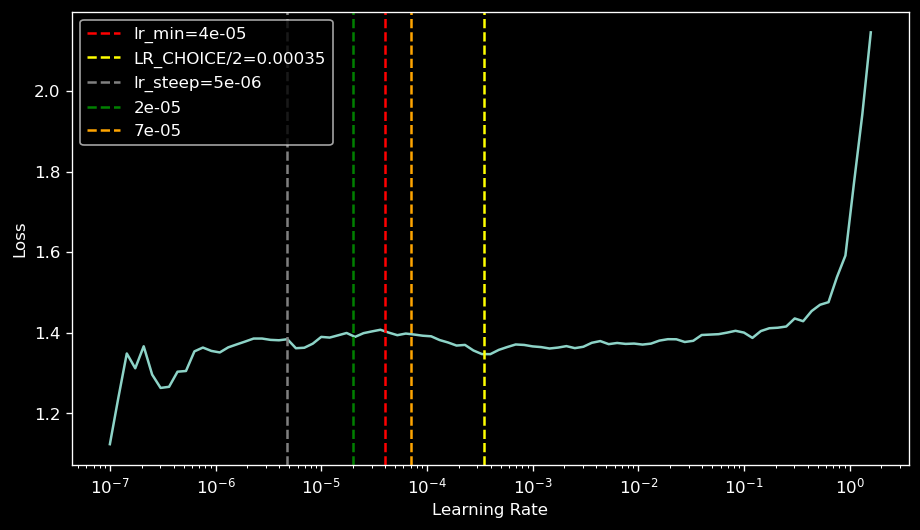

In [25]:
lr_min,lr_steep = learn.lr_find()
plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
plt.axvline(LR_CHOICE/2, ls='--', color='yellow', label=f'LR_CHOICE/2={round(LR_CHOICE/2,6)}')
plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
plt.axvline(2e-5, ls='--', color='green', label=f'{round(2e-5,6)}')
plt.axvline(7e-5, ls='--', color='orange', label=f'{round(7e-5,6)}')

plt.legend()
plt.show()

In [28]:
EPOCHS = 8
LR_CHOICE_UNFROZ = 0.06

In [29]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

EPOCHS:         8
Learning Rate:  0.06




epoch,train_loss,valid_loss,accuracy,time
0,1.733146,3.946400,0.342797,02:05
1,1.695282,1.566119,0.440589,02:05
2,1.646481,1.782473,0.447687,02:06
3,1.695861,1.439927,0.442429,02:06
4,1.608191,1.372076,0.483701,02:05
5,1.526237,1.311261,0.505783,02:06
6,1.458333,2.782098,0.548370,02:05
7,1.416152,1.221273,0.608307,02:05


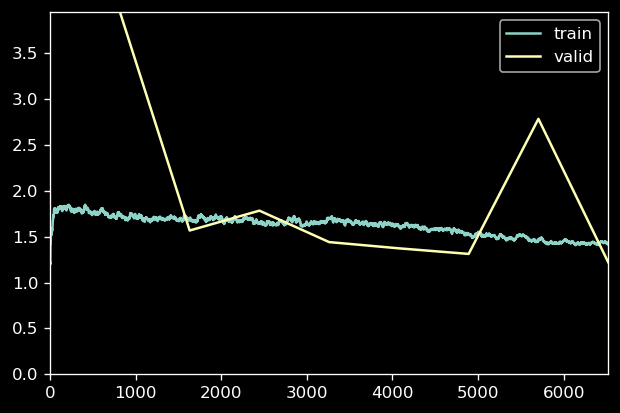

Max GPU Memory Allocated: 3.278372864 GB


/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(


In [30]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.5, wd=0.1) # , reset_opt=True)
print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

<br>
<br>

## Persist the Model

In [39]:
learn.export(f'../models/{RUN_NAME}.pkl')
print(f'Saved to: ../models/{RUN_NAME}.pkl')

# path = Path('../models')
# path.ls(file_exts='.pkl')

Saved to: ../models/20210211-0115 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460.pkl


<br>
<br>

### Show some Results

/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


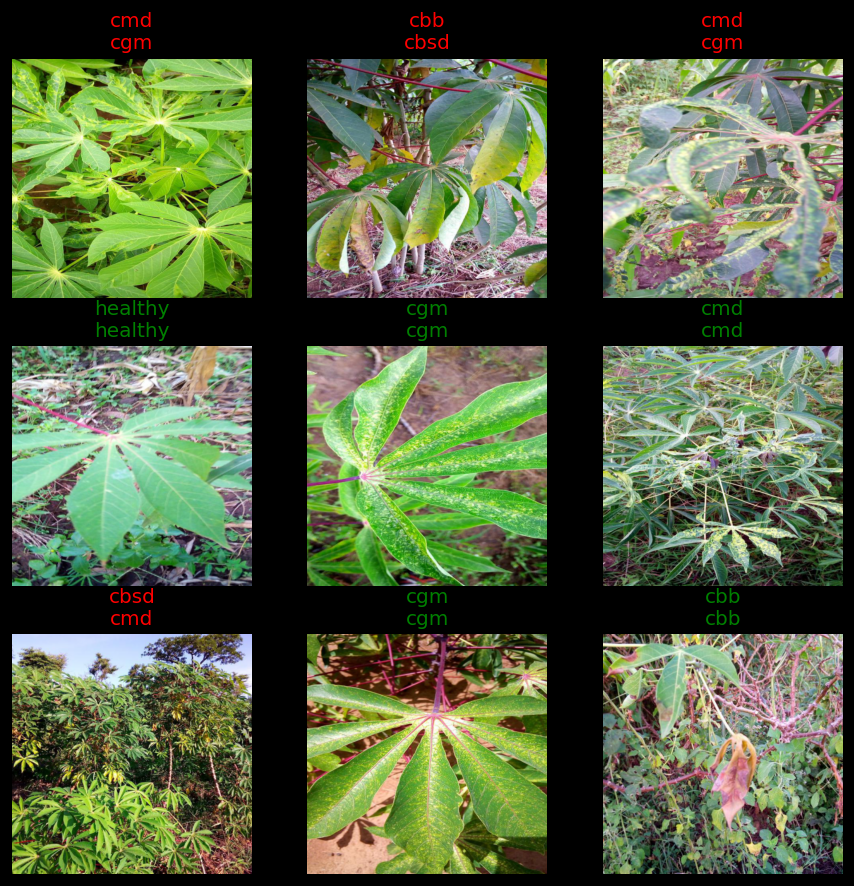

In [40]:
learn.show_results()

<br>
<hr>
<br>
<br>
<br>

# Validation Set (not test set) Analysis

<br>

### Plot Losses

In [41]:
# learn.recorder.plot_loss()
# plt.ylabel('Loss')
# plt.xlabel('Batches Processed')

<br>

### Visualize with a confusion Matrix

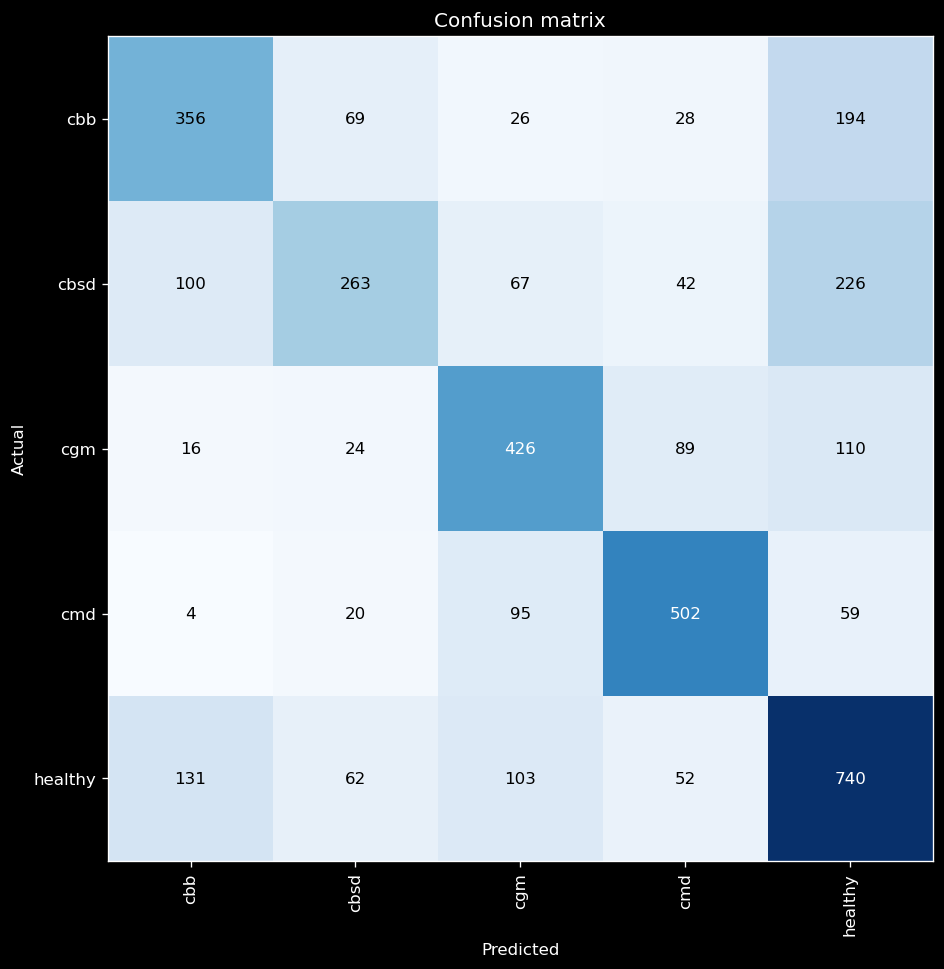

In [42]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

In [43]:
interp.most_confused()[:10]

[('cbsd', 'healthy', 226),
 ('cbb', 'healthy', 194),
 ('healthy', 'cbb', 131),
 ('cgm', 'healthy', 110),
 ('healthy', 'cgm', 103),
 ('cbsd', 'cbb', 100),
 ('cmd', 'cgm', 95),
 ('cgm', 'cmd', 89),
 ('cbb', 'cbsd', 69),
 ('cbsd', 'cgm', 67)]

<br>
<br>

## Classification Report

In [44]:
interp.print_classification_report()

              precision    recall  f1-score   support

         cbb       0.59      0.53      0.56       673
        cbsd       0.60      0.38      0.46       698
         cgm       0.59      0.64      0.62       665
         cmd       0.70      0.74      0.72       680
     healthy       0.56      0.68      0.61      1088

    accuracy                           0.60      3804
   macro avg       0.61      0.59      0.59      3804
weighted avg       0.60      0.60      0.60      3804



<br>

### Show the top 15 most error prone images

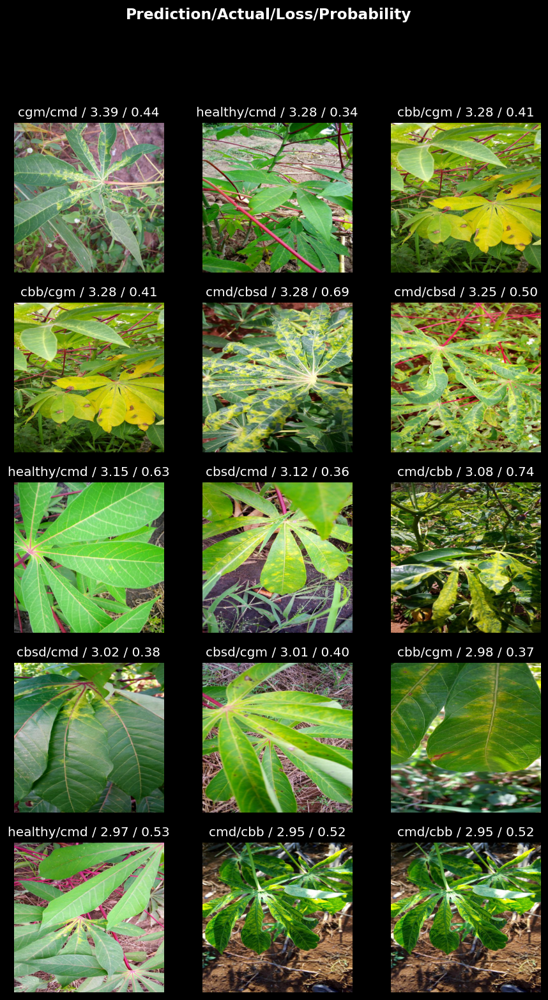

In [45]:
interp.plot_top_losses(15, nrows=5)

## Validation

In [46]:
test_learn = learn

# load_learner('../models/20210205-1716 - arch=xresnet34 - samples=1800 frozen=1 epochs=40 bs=32 res=340.pkl', cpu=False)
# load_model(f'models/{RUN_NAME}_26.pth', test_learn, opt=Adam, with_opt=False)


In [47]:
def get_test_fnames(path):
    retlist = []
    
    for l in test_flist.values():
        for f in l:
            retlist.append(f)
            
    return random.sample(retlist, len(retlist))

In [48]:
test_db = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_test_fnames,
    get_y=parent_label, 
    item_tfms=Resize(RESOLUTION, method='bilinear'), batch_tfms=batch_tfms) #,
#     item_tfms=CropPad(RESOLUTION, pad_mode='zeros'))
#    ,    batch_tfms=aug_transforms(do_flip=True, size=RESOLUTION, batch=False, max_zoom=1.0, mult=1, pad_mode='zeros'))


dls = test_db.dataloaders(get_test_fnames, bs=BATCH_SIZE)

test_dl = dls.test_dl(get_test_fnames('None'), with_labels=True)

####  Get the Inferrences on the Test Set

In [ ]:
inputs, preds, targs, decoded, losses = test_learn.get_preds(dl=test_dl, with_input=True, with_decoded=True, with_loss=True)


/home/frank/miniconda3/envs/learn/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


In [ ]:
interp = ClassificationInterpretation(dl=test_dl, inputs=inputs, preds=preds, targs=targs, decoded=decoded, losses=losses )

<br>

### Visualize with a confusion Matrix

In [ ]:
interp.plot_confusion_matrix(figsize=(8,8))

In [44]:
interp.most_confused()[:10]

[('cbsd', 'healthy', 62),
 ('cbb', 'healthy', 58),
 ('cbsd', 'cbb', 49),
 ('cgm', 'healthy', 44),
 ('healthy', 'cbb', 35),
 ('cgm', 'cmd', 32),
 ('cmd', 'cgm', 31),
 ('cmd', 'healthy', 21),
 ('cbb', 'cbsd', 20),
 ('healthy', 'cgm', 20)]

<br>
<br>

## Classification Report

In [45]:
interp.print_classification_report()

              precision    recall  f1-score   support

         cbb       0.65      0.67      0.66       272
        cbsd       0.74      0.51      0.60       272
         cgm       0.72      0.64      0.68       272
         cmd       0.79      0.75      0.77       272
     healthy       0.53      0.76      0.63       272

    accuracy                           0.67      1360
   macro avg       0.69      0.67      0.67      1360
weighted avg       0.69      0.67      0.67      1360



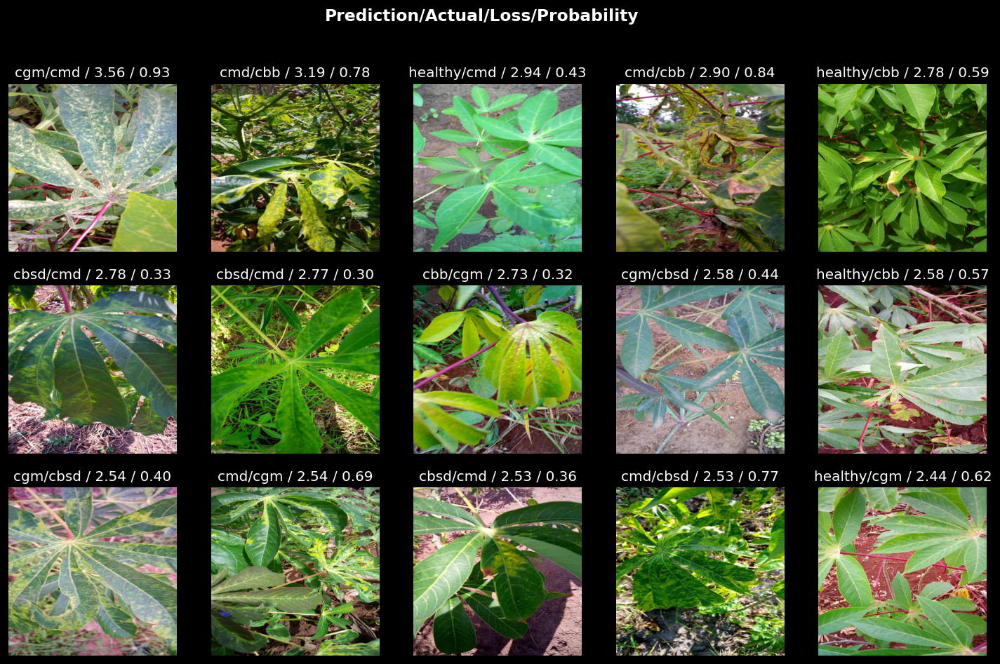

In [46]:
interp.plot_top_losses(k=15)

## Archive this version of the notebook

In [47]:
import os
import shutil

# Allow Jupyter the opportunity to autosave
# !sleep 20
# time = '20210122-2356'
# copy the notebook file - the prefix links it to the saved model
shutil.copyfile('FastAI Cassava Disease Classification-Copy1.ipynb', f'.Archive/{time} - FastAI Cassava Disease Classification-Copy1.ipynb')

'.Archive/20210210-2234 - FastAI Cassava Disease Classification-Copy1.ipynb'

## Infer on the Kaggle provided test set